<a href="https://colab.research.google.com/github/PedroAugustoMartinsG/O-Desafio-de-Aprendizagem-Adaptativa/blob/main/Aprendizagem_Adaptativa_Pedro_Augusto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Versão ideal do PandasReport
!pip install pandas-profiling==2.7.1

# O Desafio de Aprendizagem Adaptativa 
O objetivo desse desafio é criar um modelo de *Machine Learning* capaz de prever a probabilidade de um aluno qualquer acertar a próxima questão, dada uma sequência prévia de 100 resoluções em ambiente de *E-learning*.

por Pedro Augusto Martins Gagini

---



- Vamos usar os seguintes *datasets* (disponibilizados pela *EdTech* QConcursos através do *marketplace* SigmaGeek):
    - https://sigmageek.com
    - https://drive.google.com/drive/folders/1k5PM_L6GDi63-PuNTuGK6fQaiB8K_HFi?usp=share_link

In [2]:
# Mostrar todas as colunas dos datasets
from google.colab.data_table import DataTable
DataTable.max_columns = 32

## Exploração dos dados da QConcursos
- Importar bibliotecas
- Conhecer os *datasets*


**Antes de aplicar algoritmos de AM a um conjunto de dados, é importante que os dados sejam analisados. Essa análise, que pode ser realizada por técnicas estatísticas e de visualização, permite uma melhor compreensão da distribuição dos dados e pode dar suporte à escolha de formas de abordar o problema (Faceli et al., 2011).**

In [3]:
# Importar principais bibliotecas
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pandas import read_csv
from pandas_profiling import ProfileReport
import seaborn as sns

pd.options.display.float_format = '{:,.2f}'.format
%matplotlib inline

In [4]:
# Acesse o arquivo Dataset_description.docx, localizado na pasta do Drive acima, para melhor entender as features
base1 = pd.read_csv("Submit.csv", sep=';')
base2 = pd.read_csv("Dataset_model.csv",low_memory=False)
base3 = pd.read_csv("subjects_questions.csv")

In [5]:
base3.info()  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1088864 entries, 0 to 1088863
Data columns (total 2 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   subject_id        1077124 non-null  float64
 1   novo_question_id  1088864 non-null  int64  
dtypes: float64(1), int64(1)
memory usage: 16.6 MB


In [6]:
base3.isnull().sum()

subject_id          11740
novo_question_id        0
dtype: int64

In [7]:
base3.head(10)

,subject_id,novo_question_id
0,"14,655.00",15
1,"19,271.00",15
2,"14,655.00",16
3,"19,271.00",16
4,"14,655.00",17
5,"19,271.00",17
6,"14,655.00",18
7,"19,271.00",18
8,"16,170.00",19
9,"16,180.00",19


In [8]:
base3.tail(10)

,subject_id,novo_question_id
1088854,NaN,500685
1088855,NaN,500686
1088856,NaN,500687
1088857,NaN,500688
1088858,NaN,500689
1088859,NaN,500690
1088860,NaN,500691
1088861,NaN,500692
1088862,NaN,500693
1088863,NaN,500694


In [9]:
base3.describe()

,subject_id,novo_question_id
count,"1,077,124.00","1,088,864.00"
mean,"14,532.75","249,565.93"
std,"6,714.82","144,218.19"
min,5.00,1.00
25%,"14,347.00","124,278.00"
50%,"16,161.00","250,609.00"
75%,"18,937.00","374,591.25"
max,"28,114.00","500,694.00"


In [10]:
base2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156376 entries, 0 to 156375
Data columns (total 32 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   novo_user_id            156376 non-null  int64  
 1   city                    147976 non-null  object 
 2   country                 155476 non-null  object 
 3   device                  151176 non-null  object 
 4   device_type             146576 non-null  object 
 5   os                      155476 non-null  object 
 6   platform                155476 non-null  object 
 7   region                  155476 non-null  object 
 8   gp:carrers              146076 non-null  object 
 9   gp:college type         0 non-null       float64
 10  gp:degree course        0 non-null       float64
 11  gp:previous experience  30700 non-null   object 
 12  gp:school type          0 non-null       float64
 13  gp:segment              154476 non-null  object 
 14  gp:source_project   

In [11]:
base2.isnull().sum()

novo_user_id                   0
city                        8400
country                      900
device                      5200
device_type                 9800
os                           900
platform                     900
region                       900
gp:carrers                 10300
gp:college type           156376
gp:degree course          156376
gp:previous experience    125676
gp:school type            156376
gp:segment                  1900
gp:source_project           2100
acertou                        0
created_at                     0
row                            0
commented_by_professor         5
difficulty                   150
discipline_id                  5
examining_board_id             5
institute_id                   5
knowledge_area_id              6
modality_id                    6
nullified                      6
outdated                       6
product_id                     6
publication_year               7
right_answer                   6
scholarity

In [12]:
base2.head()

,novo_user_id,city,country,device,device_type,os,platform,region,gp:carrers,gp:college type,...,institute_id,knowledge_area_id,modality_id,nullified,outdated,product_id,publication_year,right_answer,scholarity_id,novo_question_id
0,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,"4,126.00",13.00,1.00,0.00,0.00,1.00,"2,022.00",A,2.00,"489,400.00"
1,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,"4,126.00",13.00,1.00,0.00,0.00,1.00,"2,022.00",C,2.00,"489,399.00"
2,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,"4,126.00",13.00,1.00,0.00,0.00,1.00,"2,022.00",D,2.00,"489,398.00"
3,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,"4,126.00",13.00,1.00,0.00,0.00,1.00,"2,022.00",A,2.00,"489,397.00"
4,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,"4,126.00",13.00,1.00,0.00,0.00,1.00,"2,022.00",E,2.00,"489,396.00"


In [13]:
base2.tail()

,novo_user_id,city,country,device,device_type,os,platform,region,gp:carrers,gp:college type,...,institute_id,knowledge_area_id,modality_id,nullified,outdated,product_id,publication_year,right_answer,scholarity_id,novo_question_id
156371,1564,Joao Camara,Brazil,Samsung Tablet,Samsung Galaxy Tab A7,android 11,Android,Rio Grande do Norte,"Tribunal, Legislativa, Administrativa",NaN,...,"6,586.00",9.00,2.00,0.00,0.00,1.00,"2,021.00",C,2.00,"472,827.00"
156372,1564,Joao Camara,Brazil,Samsung Tablet,Samsung Galaxy Tab A7,android 11,Android,Rio Grande do Norte,"Tribunal, Legislativa, Administrativa",NaN,...,"6,586.00",9.00,2.00,0.00,0.00,1.00,"2,021.00",E,2.00,"472,826.00"
156373,1564,Joao Camara,Brazil,Samsung Tablet,Samsung Galaxy Tab A7,android 11,Android,Rio Grande do Norte,"Tribunal, Legislativa, Administrativa",NaN,...,"6,586.00",9.00,2.00,0.00,0.00,1.00,"2,021.00",C,2.00,"472,825.00"
156374,1564,Joao Camara,Brazil,Samsung Tablet,Samsung Galaxy Tab A7,android 11,Android,Rio Grande do Norte,"Tribunal, Legislativa, Administrativa",NaN,...,"6,586.00",9.00,2.00,0.00,0.00,1.00,"2,021.00",C,2.00,"472,824.00"
156375,1564,Joao Camara,Brazil,Samsung Tablet,Samsung Galaxy Tab A7,android 11,Android,Rio Grande do Norte,"Tribunal, Legislativa, Administrativa",NaN,...,3.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
base2.describe()

,novo_user_id,gp:college type,gp:degree course,gp:school type,acertou,row,commented_by_professor,difficulty,discipline_id,examining_board_id,institute_id,knowledge_area_id,modality_id,nullified,outdated,product_id,publication_year,scholarity_id,novo_question_id
count,"156,376.00",0.00,0.00,0.00,"156,376.00","156,376.00","156,371.00","156,226.00","156,371.00","156,371.00","156,371.00","156,370.00","156,370.00","156,370.00","156,370.00","156,370.00","156,369.00","156,370.00","156,375.00"
mean,782.38,NaN,NaN,NaN,0.70,50.49,0.57,2.00,61.93,115.96,"3,796.69",12.36,1.27,0.00,0.04,1.31,"2,015.16",2.74,"192,853.66"
std,451.42,NaN,NaN,NaN,0.46,28.86,0.49,0.85,134.20,248.97,"3,061.66",21.93,0.44,0.06,0.18,1.27,3.83,0.46,"124,493.00"
min,1.00,NaN,NaN,NaN,0.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00,1.00,0.00,0.00,1.00,"2,000.00",1.00,6.00
25%,391.00,NaN,NaN,NaN,0.00,25.00,0.00,1.00,3.00,2.00,107.00,9.00,1.00,0.00,0.00,1.00,"2,013.00",3.00,"80,298.50"
50%,782.00,NaN,NaN,NaN,1.00,50.00,1.00,2.00,9.00,2.00,"5,701.00",9.00,1.00,0.00,0.00,1.00,"2,016.00",3.00,"190,462.00"
75%,"1,173.00",NaN,NaN,NaN,1.00,75.00,1.00,3.00,35.00,152.00,"6,153.00",9.00,2.00,0.00,0.00,1.00,"2,018.00",3.00,"283,582.50"
max,"1,564.00",NaN,NaN,NaN,1.00,100.00,1.00,5.00,593.00,"3,553.00","10,265.00",324.00,2.00,1.00,1.00,9.00,"2,022.00",3.00,"500,593.00"


In [15]:
base1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   novo_user_id            20000 non-null  int64  
 1   city                    18576 non-null  object 
 2   country                 19868 non-null  object 
 3   device                  19284 non-null  object 
 4   device_type             18368 non-null  object 
 5   os                      19868 non-null  object 
 6   platform                19868 non-null  object 
 7   region                  19863 non-null  object 
 8   gp:carrers              18831 non-null  object 
 9   gp:college type         25 non-null     object 
 10  gp:degree course        25 non-null     object 
 11  gp:previous experience  9478 non-null   object 
 12  gp:school type          25 non-null     object 
 13  gp:segment              19648 non-null  object 
 14  gp:source_project       19620 non-null

In [16]:
base1.isnull().sum()

novo_user_id                  0
city                       1424
country                     132
device                      716
device_type                1632
os                          132
platform                    132
region                      137
gp:carrers                 1169
gp:college type           19975
gp:degree course          19975
gp:previous experience    10522
gp:school type            19975
gp:segment                  352
gp:source_project           380
acertou                   20000
created_at                    0
row                           0
commented_by_professor        2
difficulty                   29
discipline_id                 2
examining_board_id            2
institute_id                  2
knowledge_area_id             2
modality_id                   2
nullified                     2
outdated                      2
product_id                    2
publication_year              2
right_answer                  2
scholarity_id                 2
novo_que

In [17]:
base1.head(3)

,novo_user_id,city,country,device,device_type,os,platform,region,gp:carrers,gp:college type,...,institute_id,knowledge_area_id,modality_id,nullified,outdated,product_id,publication_year,right_answer,scholarity_id,novo_question_id
0,1,Rio de Janeiro,Brazil,Apple iPhone,Apple iPhone 11 Pro Max,ios 15.4.1,iOS,Rio de Janeiro,"Tribunal, Administrativa",NaN,...,"6,289.00",13.00,1.00,0.00,0.00,1.00,"2,021.00",B,3.00,484766
1,2,São Paulo,Brazil,Windows,Windows,Chrome 104,Web,Sao Paulo,Tribunal,NaN,...,"2,994.00",53.00,1.00,0.00,0.00,1.00,"2,016.00",C,3.00,159545
2,3,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.5,iOS,Minas Gerais,"Controle e Gestão, Outras, Administrativa",NaN,...,20.00,14.00,1.00,0.00,0.00,1.00,"2,017.00",C,3.00,233145


In [18]:
base1.tail(3)

,novo_user_id,city,country,device,device_type,os,platform,region,gp:carrers,gp:college type,...,institute_id,knowledge_area_id,modality_id,nullified,outdated,product_id,publication_year,right_answer,scholarity_id,novo_question_id
19997,19998,Salvador,Brazil,Windows,Windows,Chrome 104,Web,Bahia,Administrativa,NaN,...,"2,791.00",2.00,1.00,0.00,0.00,1.00,"2,021.00",E,2.00,441819
19998,19999,NaN,Brazil,Samsung Phone,Samsung Galaxy M51,android 12,Android,Alagoas,Administrativa,NaN,...,"6,453.00",2.00,1.00,0.00,0.00,1.00,"2,021.00",A,2.00,443217
19999,20000,NaN,Brazil,Apple iPhone,Apple iPhone 11,ios 15.6,iOS,Sao Paulo,Saúde,NaN,...,265.00,27.00,1.00,0.00,0.00,1.00,"2,019.00",D,3.00,426068


In [19]:
base1.describe()

,novo_user_id,acertou,row,commented_by_professor,difficulty,discipline_id,examining_board_id,institute_id,knowledge_area_id,modality_id,nullified,outdated,product_id,publication_year,scholarity_id,novo_question_id
count,"20,000.00",0.00,"20,000.00","19,998.00","19,971.00","19,998.00","19,998.00","19,998.00","19,998.00","19,998.00","19,998.00","19,998.00","19,998.00","19,998.00","19,998.00","20,000.00"
mean,"10,000.50",NaN,101.00,0.55,1.99,73.48,185.47,"4,566.41",15.83,1.26,0.00,0.01,1.37,"2,016.81",2.64,"275,686.74"
std,"5,773.65",NaN,0.00,0.50,0.86,139.63,344.02,"2,908.25",29.96,0.44,0.05,0.12,1.28,3.83,0.52,"137,444.81"
min,1.00,NaN,101.00,0.00,1.00,1.00,1.00,1.00,1.00,1.00,0.00,0.00,1.00,"2,000.00",1.00,16.00
25%,"5,000.75",NaN,101.00,0.00,1.00,3.00,2.00,925.00,9.00,1.00,0.00,0.00,1.00,"2,015.00",2.00,"171,023.75"
50%,"10,000.50",NaN,101.00,1.00,2.00,9.00,63.00,"5,782.00",9.00,1.00,0.00,0.00,1.00,"2,018.00",3.00,"277,156.50"
75%,"15,000.25",NaN,101.00,1.00,3.00,56.00,211.00,"6,270.00",14.00,2.00,0.00,0.00,1.00,"2,019.00",3.00,"391,992.50"
max,"20,000.00",NaN,101.00,1.00,5.00,593.00,"3,712.00","10,265.00",324.00,2.00,1.00,1.00,9.00,"2,022.00",3.00,"500,594.00"


In [20]:
profile = ProfileReport(base3)
profile

Summarize dataset:   0%|          | 0/14 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [23]:
# Se der erro ao gerar o ProfileReport por falta de espaço:
# Baixe o arquivo Dataset_model.csv, disponível no link acima; e
# Execute no seu computador o seguinte comando: pandas_profiling --title "Profiling Report"  Dataset_model.csv report.html
profile = ProfileReport(base2)
profile

Summarize dataset:   0%|          | 0/44 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [22]:
profile = ProfileReport(base1)
profile

Summarize dataset:   0%|          | 0/44 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Questionamentos do *dataset* Dataset_model.csv
- As questões são iguais para todos? Não, todas as sequências são distintas entre si.
- As primeiras questões são iguais para todos? Não, a primeira questão que mais se repetiu foi a 289281 por somente 20 vezes (valor muito baixo em relação ao total, 20 mil).
- Há questões repetidas para o mesmo estudante? Se sim, qual o impacto? Sim,  podem ter até 84 questões repetidas na mesma série; somente 5.60425% das repetições foram assinaladas incorretamente.
- A quantidade de acertos tende a crescer? Sim, a média móvel indica uma tendência de crescimento.
- As questões são feitas de forma ininterrupta? Não, há estudantes que demoram anos; outros, minutos para responder às suas sequências.


In [24]:
# Verificar quantas sequências são exatamente iguais
from collections import Counter

my_series = base2['novo_question_id'].squeeze() # Converter de DataFrame para Series
listaSeq = [] # Cada sequência é uma lista dentro da variável
listaAux = [] # Lista temporária com a sequência respectiva
count = 0 # Quantidade de sequências repetidas
# Adiciona a lista auxiliar à listaSeq, e a remove a cada nova sequência 
for idx in range(len(my_series)):
    if idx%100==0:
        if listaAux in listaSeq:
            count+=1
        listaSeq.append(listaAux)
        listaAux = []
    listaAux.append(my_series[idx])
print(count) # 0

0


In [25]:
# Mensurar o impacto das questões repetidas nos acertos
from collections import Counter

seriesQuestionId = base2['novo_question_id'].squeeze() # Converter de DataFrame para Series
seriesAcertou = base2['acertou'].squeeze() # Converter de DataFrame para Series
sumErr = 0 # Quantidade de questões repetidas e erradas
repet = 0 # Quantidade de questões repetidas
maxRepet = 0 # Quantidade máxima de questões repetidas
maxRepetId = 0 # Id do aluno com mais questões repetidas
# Calcular o número de repetições e a quantidade de questões repetidas e erradas
for i in range(0,len(seriesQuestionId),100):
  lista = seriesQuestionId[i:i+100]
  c = Counter(lista) 
  duplicates = {key:value for key, value in c.items() if value > 1} # Dicionário das questões repetidas da sequência
  for numero, repeticoes in duplicates.items():
    result = [indice for indice, item in enumerate(lista) if item == numero] # Índice das repetições
    if len(result) > maxRepet:
      maxRepet = len(result)
      maxRepetId = i//100
    for j in result[1:]: # Não computar a própria questão
      if seriesAcertou[j] == 0:
        sumErr+=1
        repet+=1
print(f'Das {repet} repetições, erraram-se {sumErr}, ou {sumErr/2_000_000*100}%')  
print(f'O aluno com mais questões repetidas foi o {maxRepetId+1} com {maxRepet} de 100')      

Das 6957 repetições, erraram-se 6957, ou 0.34785%
O aluno com mais questões repetidas foi o 281 com 13 de 100


In [26]:
# Verificar quantas sequências começam com a mesma questão
from collections import Counter

my_series = base2['novo_question_id'].squeeze() # Converter de DataFrame para Series
lista = []
# Adicionar o primeiro elemento de cada sequência à lista
for idx in range(len(my_series)):
    if idx%100==0:
        lista.append(my_series[idx])
# Calcular a quantidade de repetições para cada questão
counts = dict(Counter(lista))
duplicates = {key:value for key, value in counts.items() if value > 1}
times=0
# Imprimir as cinco maiores repetições
for i in sorted(duplicates, key = duplicates.get, reverse=True):
    if times==5:
        break    
    times+=1
    print(i, duplicates[i])

292378.0 3
78361.0 3
299963.0 2
197567.0 2
190878.0 2


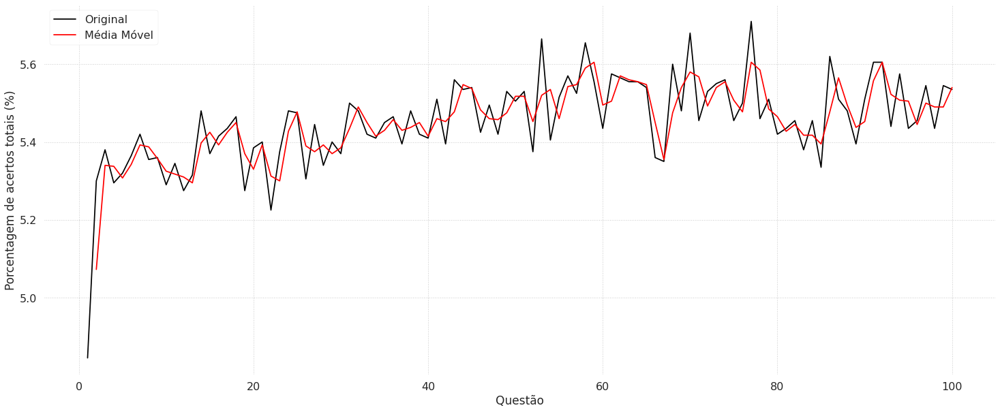

In [27]:
# Gráfico AcertosTotais x Questão 
base = base2[['acertou','row']].groupby(['row']).sum() #Quantidade de acertos por questão
eixoY = base['acertou']/20_000*100 # Valor em porcentagem
acertou_average = eixoY.rolling(window=2).mean()
plt.figure(figsize=(25, 10))
plt.plot(eixoY, 'k-', label='Original')
plt.plot(acertou_average, 'r-', label='Média Móvel')
plt.rc('legend', fontsize = 16) 
plt.ylabel('Porcentagem de acertos totais (%)', fontsize = 17)
plt.xlabel('Questão', fontsize = 17)
plt.tick_params(labelsize=16)
plt.grid(linestyle=':')
plt.legend(loc='upper left')
plt.show()

In [28]:
# Armazenar o tempo total empenhado por cada aluno
from datetime import datetime
from dateutil.relativedelta import relativedelta

# Verificar o tempo médio da série  
my_series = base2['created_at'].squeeze() # Converter de DataFrame para Series
my_series= my_series.astype(str) # Converter para string
lista = [] # Cada tempo empenhadado por sequência é uma lista dentro da variável
# Adicionar o delta de cada sequência à lista
f = "%Y-%m-%d %H:%M:%S" # Formato das datas de resolução da questão
ini = datetime.strptime(my_series[0], f)
for idx in range(100,len(my_series),100):
  fim = datetime.strptime(my_series[idx-1], f)
  dif = abs((fim - ini).total_seconds())
  lista.append(int(dif))
  ini = datetime.strptime(my_series[idx], f)

In [29]:
# Imprimir resultados da célula anterior
import datetime 

# Imprimir os dez menores tempos empenhados
for i in sorted(lista)[:10]:
  print(str(datetime.timedelta(seconds = i)))
print('...')
# Imprimir os dez maiores tempos empenhados
for i in sorted(lista)[::-1][:10]:
  print(str(datetime.timedelta(seconds = i)))

0:39:14
0:39:42
0:50:12
1:22:14
1:28:02
1:28:53
2:11:34
2:12:23
2:24:57
2:44:39
...
2583 days, 16:27:28
2486 days, 23:12:30
2443 days, 6:34:05
2228 days, 20:33:21
2219 days, 17:43:37
2215 days, 9:33:25
2199 days, 1:56:08
2166 days, 11:28:58
2155 days, 21:27:23
2141 days, 5:55:29


In [30]:
# Imprimir a mediana
from statistics import median

str(datetime.timedelta(seconds = median(sorted(lista)))) # Mediana é menos sensível a outliers

'101 days, 20:15:33'

## Tratando a base para usar no modelo
- Converter variáveis categóricas em numéricas
- Analisar a base corrigida



In [31]:
# Converter principais variáveis categóricas em numéricas nos arquivos "Submit.csv" e "DataBase_model.csv"
dictSegment = {'Concurso Público': 1, 'Concurso Militar': 2,
                'OAB': 3, 'Enem': 4}
dictRightAnswer = {'A': 1, 'B': 2, 'C': 3, 
                   'D': 4,'E': 5, 'X': np.nan,
                   '*': np.nan, '+': np.nan}
# Substituir os valores originais pelos dicionários        
base1['gp:segment'] = base1['gp:segment'].replace(dictSegment)
base1['right_answer'] = base1['right_answer'].replace(dictRightAnswer)
base2['gp:segment'] = base2['gp:segment'].replace(dictSegment)
base2['right_answer'] = base2['right_answer'].replace(dictRightAnswer)

In [32]:
# Analisar as novas bases
print(base1.info(), end="\n")
print(base2.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   novo_user_id            20000 non-null  int64  
 1   city                    18576 non-null  object 
 2   country                 19868 non-null  object 
 3   device                  19284 non-null  object 
 4   device_type             18368 non-null  object 
 5   os                      19868 non-null  object 
 6   platform                19868 non-null  object 
 7   region                  19863 non-null  object 
 8   gp:carrers              18831 non-null  object 
 9   gp:college type         25 non-null     object 
 10  gp:degree course        25 non-null     object 
 11  gp:previous experience  9478 non-null   object 
 12  gp:school type          25 non-null     object 
 13  gp:segment              19648 non-null  float64
 14  gp:source_project       19620 non-null

In [33]:
# Analisar valores únicos das novas bases
print(base1['gp:segment'].unique(), end="\n")
print(base1['right_answer'].unique(), end="\n")
print(base2['gp:segment'].unique(), end="\n")
print(base2['right_answer'].unique(), end="\n")

[ 1. nan  2.  3.  4.]
[ 2.  3.  1.  5.  4. nan]
[ 1. nan  2.]
[ 1.  3.  4.  5.  2. nan]


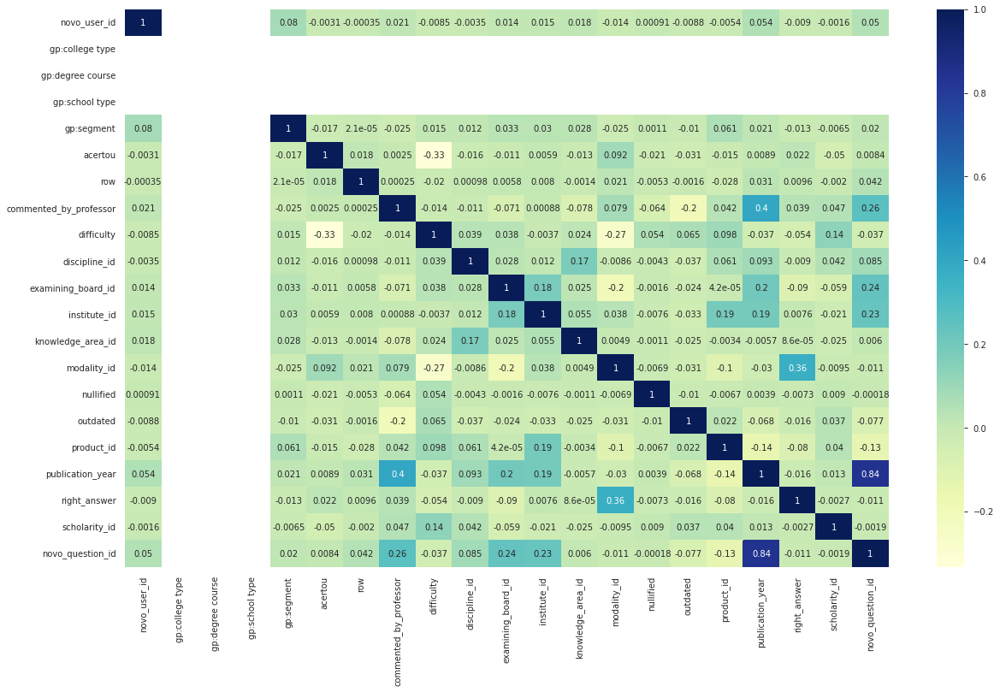

In [34]:
# Imprimir a correlação entre as variáveis
plt.figure(figsize=(20,12))
sns.heatmap(base2.corr(),annot=True,cmap="YlGnBu")
plt.show()

## Selecionando a base para usar no modelo
- Definir variáveis mais importantes
- Definir variáveis de maior correlação
- Remover valores nulos
- Analisar a nova base



In [35]:
# Selecionar as melhores colunas do dataset, i.e., baixa quantidade de valores faltantes e alta relêvancia 
base = base2[["novo_user_id","gp:segment","acertou","row","difficulty","discipline_id","examining_board_id","institute_id","knowledge_area_id","modality_id","right_answer","scholarity_id","novo_question_id"]]

In [36]:
# Retirar valor nulos do dataset
base = base.dropna(axis=0)
base.info() # Perderam-se 37.847 instâncias, i.e., reduziu-se em 1.89235% o tamanho do dataset

<class 'pandas.core.frame.DataFrame'>
Int64Index: 154322 entries, 0 to 156374
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   novo_user_id        154322 non-null  int64  
 1   gp:segment          154322 non-null  float64
 2   acertou             154322 non-null  int64  
 3   row                 154322 non-null  int64  
 4   difficulty          154322 non-null  float64
 5   discipline_id       154322 non-null  float64
 6   examining_board_id  154322 non-null  float64
 7   institute_id        154322 non-null  float64
 8   knowledge_area_id   154322 non-null  float64
 9   modality_id         154322 non-null  float64
 10  right_answer        154322 non-null  float64
 11  scholarity_id       154322 non-null  float64
 12  novo_question_id    154322 non-null  float64
dtypes: float64(10), int64(3)
memory usage: 16.5 MB


In [37]:
# Visualizar a base
base.head()

,novo_user_id,gp:segment,acertou,row,difficulty,discipline_id,examining_board_id,institute_id,knowledge_area_id,modality_id,right_answer,scholarity_id,novo_question_id
0,1,1.00,0,1,4.00,238.00,73.00,"4,126.00",13.00,1.00,1.00,2.00,"489,400.00"
1,1,1.00,0,2,4.00,238.00,73.00,"4,126.00",13.00,1.00,3.00,2.00,"489,399.00"
2,1,1.00,1,3,3.00,238.00,73.00,"4,126.00",13.00,1.00,4.00,2.00,"489,398.00"
3,1,1.00,0,4,4.00,238.00,73.00,"4,126.00",13.00,1.00,1.00,2.00,"489,397.00"
4,1,1.00,1,5,3.00,238.00,73.00,"4,126.00",13.00,1.00,5.00,2.00,"489,396.00"


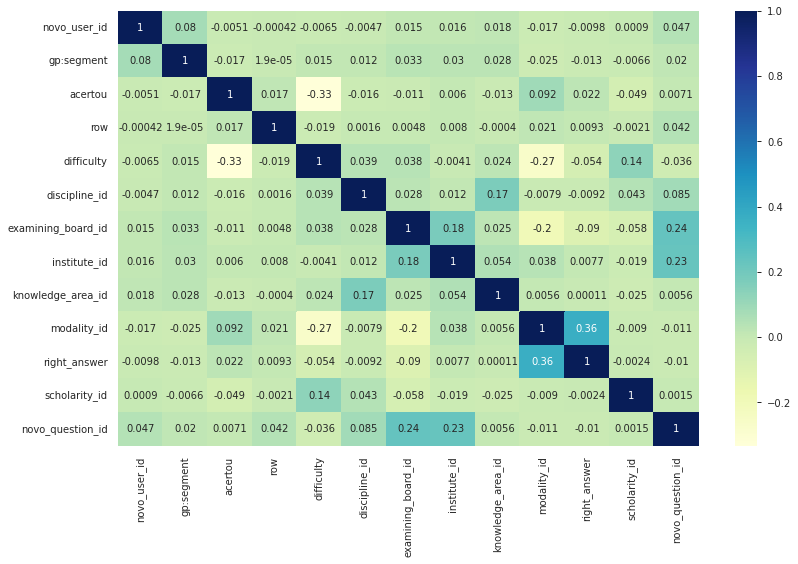

In [38]:
# Mostrar a correlação entre as principais variáveis
plt.figure(figsize=(13,8))
sns.heatmap(base.corr(),annot=True,cmap="YlGnBu")
plt.show()

## Preparando o modelo
- Separar variáveis
- Separar base em treino e teste
- Prever dados de teste
- Transformar resultados
- Visualizar Real x Predição x Probabilidade


**O primeiro passo vai ser separar entre a nossa variável que queremos prever (Y) e quais vão ser as colunas que vamos usar para essa previsão (X)**

In [39]:
Y = base.acertou
X = base.drop('acertou', axis=1)

**Em seguida, vamos separar a nossa base em treino e teste**
- A base de treino vai ser usada para treinar o modelo, para que ele faça as previsões
- A base de teste vai ser usada para, ao usar o modelo já treinado, verificar o erro da previsão feita pelo modelo em relação aos valores reais

In [40]:
# Separar em 70% treino e 30% teste (Hold-out) 
from sklearn.model_selection import train_test_split
x_treino,x_teste,y_treino,y_teste = train_test_split(X,Y, test_size=0.3) 

In [41]:
# Analisar shapes
x_treino.shape, y_treino.shape, x_teste.shape, y_teste.shape

((108025, 12), (108025,), (46297, 12), (46297,))

**Pelas características do desafio, pode-se enfrentá-lo por uma abordagem supervisionada e preditiva com dados inteiros não negativos rotulados, da ordem de milhões. Nesse contexto, Regressão Linear é o modelo de AM ideal para solucionar a predição proposta.**

In [42]:
# Instanciando o modelo
from sklearn.linear_model import LinearRegression
modelo_regressao = LinearRegression()

In [43]:
# Realizando o fit do modelo
modelo_regressao.fit(x_treino,y_treino)

LinearRegression()

In [44]:
# Usando o modelo para prever os dados de teste
y_regressao = modelo_regressao.predict(x_teste)

In [45]:
# Converter a probabilidade predita pelo modelo em classificação binária
y2_regressao = []
# Threshold  de 0.6
for idx in range(len(y_regressao)):
  value = 1 if y_regressao[idx]>=0.6 else 0 
  y2_regressao.append(value)
y2_regressao.count(1) # Quantidade de predições iguais a 1

33592

In [46]:
# Atribuir 1 às questões repetidas 
from collections import Counter

seriesQuestionsId = base2['novo_question_id'].squeeze() # Converter de DataFrame para Series
idx = 0 # Index de y2_regressao
# Calcular e manipular repetições 
for i, row in x_teste.iterrows():
  n = int(row['novo_user_id']) - 1
  listaQuestoesId = seriesQuestionsId[n*100:n*100+100] # Sequência do aluno 
  c = Counter(listaQuestoesId) 
  duplicates = {key:value for key, value in c.items() if value > 1} # Dicionário das questões repetidas da sequência
  for numero, repeticoes in duplicates.items():
    if row['novo_question_id'] in duplicates.keys(): # Se id da questão está contida na lista de repetições
      result = [indice for indice, item in enumerate(listaQuestoesId) if item == numero] # Lista de índice das repetições
      if row['row'] in result[1:]: # Se linha da questão for repetida
        y2_regressao[idx] = 1
  idx+=1

y2_regressao.count(1) # Quantidade de predições iguais a 1

34924

In [47]:
# Visualizar Real x Predição x Probabilidade      
df1 = pd.DataFrame(y_teste.tolist(), columns = ['Real']) # Valor original
df2 = pd.DataFrame(y2_regressao, columns = ['Predição']) # Predição binária
df3 = pd.DataFrame(y_regressao, columns = ['Probabilidade']) # Probabilidade predita

df = pd.concat([df1, df2, df3], axis=1)
df.head(20)

,Real,Predição,Probabilidade
0,1,1,0.71
1,0,0,0.52
2,0,0,0.53
3,0,1,0.70
4,1,1,0.68
5,1,1,0.87
6,1,1,0.68
7,1,1,0.70
8,1,1,0.89
9,0,0,0.50


## Avaliando o modelo
- Calcular 10-Fold Cross Validation
- Avaliação do modelo preditivo

In [48]:
# 10-Fold Cross Validation
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

cv = KFold(n_splits=10, random_state=1, shuffle=True)
scores = cross_val_score(LinearRegression(), X, Y, scoring='neg_mean_squared_error',
                         cv=cv, n_jobs=-1)

In [49]:
# Avaliar o modelo
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import f1_score
from numpy import mean
from numpy import absolute
from numpy import sqrt

print('Hold-out - 70% treino e 30% teste') 
print('Erro quadrático médio: ' + str(round(mean_squared_error(y_teste,y_regressao),4)))
print('R quadrado: ' + str(round(modelo_regressao.score(x_treino,y_treino),4)))
print('F1-score: ' + str(round(f1_score(df['Real'], df['Predição']),4))) 
print('-'*35)
print('10-Fold Cross Validation')
print('Erro quadrático médio: ' + str(round(mean(absolute(scores)),4)))
print('Raiz quadrada do erro-médio: ' + str(round(sqrt(mean(absolute(scores))),4)))

Hold-out - 70% treino e 30% teste
Erro quadrático médio: 0.1883
R quadrado: 0.112
F1-score: 0.7877
-----------------------------------
10-Fold Cross Validation
Erro quadrático médio: 0.1874
Raiz quadrada do erro-médio: 0.4329


**Calcular o desempenho preditivo - em termos de taxa de acerto ou de erro, por exemplo - do modelo nos mesmos objetos empregados em seu treinamento produz estimativas otimistas, uma vez que todos os algoritmos de AM tentam melhorar de alguma forma o seu desempenho preditivo nesses objetos durante a fase indutiva. Devem-se então utilizar métodos de amostragem alternativos para obter estimativas de desempenho preditivo mais confiáveis, definindo subconjuntos de treinamento e de teste (Faceli et al., 2011).**

## Predizendo a 101ª questão
- Definir modelo preditivo
- Predizer a coluna acertou da 101ª questão
- Analisar resultados

In [50]:
# Separando a base
baseSubmit = base1[['novo_user_id','gp:segment',"acertou","row","difficulty",'discipline_id','examining_board_id','institute_id','knowledge_area_id','modality_id','right_answer','scholarity_id','novo_question_id']]
baseSubmit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   novo_user_id        20000 non-null  int64  
 1   gp:segment          19648 non-null  float64
 2   acertou             0 non-null      float64
 3   row                 20000 non-null  int64  
 4   difficulty          19971 non-null  float64
 5   discipline_id       19998 non-null  float64
 6   examining_board_id  19998 non-null  float64
 7   institute_id        19998 non-null  float64
 8   knowledge_area_id   19998 non-null  float64
 9   modality_id         19998 non-null  float64
 10  right_answer        19996 non-null  float64
 11  scholarity_id       19998 non-null  float64
 12  novo_question_id    20000 non-null  int64  
dtypes: float64(10), int64(3)
memory usage: 2.0 MB


In [51]:
# Preencher com 0 os valores vazios
baseSubmit = baseSubmit.replace(np.nan, 0) 

In [52]:
# Usar o modelo para prever os dados de teste
y_regressao = modelo_regressao.predict(baseSubmit.drop('acertou', axis=1))

In [53]:
# Imprimir coeficientes do modelo
slope = modelo_regressao.coef_
intercept = modelo_regressao.intercept_
slope, intercept

(array([-5.06926885e-06, -6.19189471e-02,  1.85734400e-04, -1.80688308e-01,
        -3.80838234e-06,  9.98143838e-06,  1.30989584e-06, -1.25980689e-04,
         1.80142435e-03,  1.79904787e-03, -5.84682950e-03, -2.86998271e-08]),
 1.1252330646648647)

In [54]:
# Aplicar os valores dos coeficientes às variáveis
x1 = baseSubmit['novo_user_id']
x2 = baseSubmit['gp:segment']
x3 = baseSubmit["row"]
x4 = baseSubmit["difficulty"]
x5 = baseSubmit['discipline_id']
x6 = baseSubmit['examining_board_id']
x7 = baseSubmit["institute_id"]
x8 = baseSubmit["knowledge_area_id"]
x9 = baseSubmit["modality_id"]
x10 = baseSubmit["right_answer"]
x11 = baseSubmit["scholarity_id"]
x12 = baseSubmit["novo_question_id"]
# Definir o modelo preditivo
f = slope[0]*x1 + slope[1]*x2 + slope[2]*x3 + slope[3]*x4 + slope[4]*x5 + slope[5]*x6 + slope[6]*x7 + slope[7]*x8 + slope[8]*x9 + slope[9]*x10 + slope[10]*x11 + slope[11]*x12

In [ ]:
# Armazenar as predições do modelo 
predicao = []
for idx in range(len(f)):
  predicao.append(modelo_regressao.predict([[x1[idx],x2[idx],x3[idx],x4[idx],x5[idx],x6[idx],x7[idx],x8[idx],x9[idx],x10[idx],x11[idx],x12[idx]]]))

In [56]:
# Converter a probabilidade predita pelo modelo em classificação binária
resposta = []
# Threshold  de 0.6
for idx in range(len(predicao)):
  value = 1 if predicao[idx]>=0.6 else 0 
  resposta.append(value)

resposta.count(1) # Quantidade de predições iguais a 1

14356

In [57]:
# Atribuir 1 às questões repetidas 
from collections import Counter

listaQuestoesId = base1['novo_question_id'].squeeze() # De Submit.csv
dataframe = base2[['novo_user_id', 'novo_question_id']].squeeze() # De Dataset_model.csv
# Calcular e manipular repetições 
for i, row in base1.iterrows():
  filtro = dataframe['novo_user_id'] == i+1 # Filtro do id do usuário
  df_user = dataframe.loc[filtro] # Filtragem id do usuário
  if row['novo_question_id'] in df_user['novo_question_id'].values: # Se questão for repetida  
    resposta[i] = 1
 
resposta.count(1) # Quantidade de predições iguais a 1

14424

In [58]:
# Converter inteiro em string
resposta = [str(i) for i in resposta]

In [59]:
# Salvar predições em um arquivo csv
import csv 

file = open('acertou.csv', 'w+', newline ='') 
with file:     
    write = csv.writer(file) 
    write.writerows(resposta) 

In [60]:
# Analisar predições da questão 101
teste = pd.read_csv("acertou.csv",header=None)
teste.describe()

,0
count,"20,000.00"
mean,0.72
std,0.45
min,0.00
25%,0.00
50%,1.00
75%,1.00
max,1.00
